In [1]:
cd ..

m:\OneDrive\Projects\federated_imputation_pc2


# Test SciencePlot Library

In [2]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
import pandas as pd
import seaborn as sns
import json

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots

import os

# Check we are in examples dir
current_dir = os.getcwd().lower()
if (current_dir.endswith('scienceplots')):
    os.chdir('./examples')
# Create 'figures' folder if it does not exist
if (not os.path.exists('./figures')):
    os.makedirs('figures')

def model(x, p):
    return x ** (2 * p + 1) / (1 + x ** (2 * p))

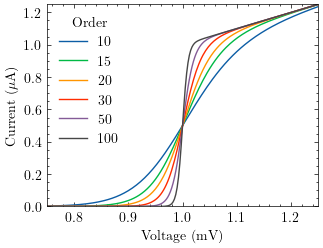

In [4]:
pparam = dict(xlabel='Voltage (mV)', ylabel=r'Current ($\mu$A)')

x = np.linspace(0.75, 1.25, 201)

with plt.style.context(['science']):
    fig, ax = plt.subplots()
    for p in [10, 15, 20, 30, 50, 100]:
        ax.plot(x, model(x, p), label=p)
    ax.legend(title='Order')
    ax.autoscale(tight=True)
    ax.set(**pparam)
    #fig.savefig('figures/fig01.jpg', dpi=300)
    #plt.close()
    plt.show()

# Line Charts Comparison Different Scenarios

In [288]:
plt.rcParams['text.usetex'] = False
marker_size = 6
lw1 = '2'
ls1 = '-'
p_line_style = '-'
c_line_style = '--'
# plot params
style_dict = {
    "central": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': c_line_style,
        'p_line_style': p_line_style,
        'line_width2': '1.5',
        "color": '#1f77b4',
        "marker": "+",
        'label': r'Central'
    }, 
    "local": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': c_line_style,
        'p_line_style': p_line_style,
        'line_width2': '1.5',
        "color": '#ff7f0e',
        "marker": "^",
        "label": r'Local'
    },
    "simpleavg": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': c_line_style,
        'p_line_style': p_line_style,
        'line_width2': '1.5',
        "color": '#2ca02c',
        "marker": "s",
        "label": r'Savg'
    },
    "fedmechw_new": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "#AE2012", #'#d62728'
        "marker": "o",
        "label": r"Cafe"
    },
}

label_size = 12

def draw_linechart(data, x_values, x_label, metrics, metrics2, output_name, legend = True, c_p_label = None):
    ms = 3
    fig, axes = plt.subplots(1, 2, figsize=(6, 2), squeeze = False)
    for idx, metric in enumerate(metrics):
        row_idx, col_idx = idx // 2, idx % 2
        print(row_idx, col_idx)
        # for method in data['method'].unique():
        #     axes[row_idx, col_idx].plot(
        #         x_values, data[data['method'] == method][metrics[idx]], 
        #         label=style_dict[method]['label'], 
        #         c = style_dict[method]['color'],
        #         marker=style_dict[method]['marker'], 
        #         markersize=marker_size,
        #         linestyle = style_dict[method]['line_style'], 
        #         linewidth = style_dict[method]['line_width'],
        #         fillstyle='none',
        #     )
           
        if idx <=1:
            for method in data['method'].unique():
                for i in range(2):
                    if i == 0: ls2 = 'c_line_style'
                    else: ls2 = 'p_line_style'
                    axes[row_idx, col_idx].plot(
                        x_values, data[data['method'] == method][metrics2[idx*2 + i]], 
                        label=style_dict[method]['label'], 
                        c = style_dict[method]['color'],
                        marker=style_dict[method]['marker'], 
                        markersize=marker_size,
                        linestyle = style_dict[method][ls2], 
                        linewidth = '2',
                        fillstyle='full'
                    )
        axes[row_idx, col_idx].set_xlabel(x_label, fontsize = label_size - 2)
        
        # if metric == 'rmse':
        #     # axes[row_idx, col_idx].set_ylim([0.05, 0.3])
        #     # axes[row_idx, col_idx].set_yticks([0.1, 0.25])
        #     #axes[row_idx, col_idx].get_yaxis().set_label_coords(-0.13,1.2)
        # elif metric == 'sliced-ws':
        #     # axes[row_idx, col_idx].set_ylim([0.0, 0.17])
        #     # axes[row_idx, col_idx].set_yticks([0.05, 0.15])
        #     #axes[row_idx, col_idx].get_yaxis().set_label_coords(-0.17,1.2)
        # elif metric == 'accu':
        #     # axes[row_idx, col_idx].set_ylim([45, 90])
        #     # axes[row_idx, col_idx].set_yticks([50, 65, 80])
        #     axes[row_idx, col_idx].get_yaxis().set_label_coords(-0.13,0.6)
        # elif metric == 'f1':
        #     # axes[row_idx, col_idx].set_ylim([25, 80])
        #     # axes[row_idx, col_idx].set_yticks([40, 60, 80])
        #     axes[row_idx, col_idx].get_yaxis().set_label_coords(-0.17,0.6)
            
        axes[row_idx, col_idx].set_xticks(x_values)
        axes[row_idx, col_idx].set_xticklabels(x_values, fontsize = label_size-4)
        axes[0, 0].set_yticks([0.1, 0.15, 0.2, 0.25])
        axes[0, 0].set_yticklabels([0.1, 0.15, 0.2, 0.25], fontsize = label_size-3)
        axes[0, 1].set_yticks([0.03, 0.08, 0.13])
        axes[0, 1].set_yticklabels([0.03, 0.08, 0.13], fontsize = label_size-3)
        #axes[row_idx, col_idx].set_ylabel(metrics[idx].upper(), fontsize = label_size)
        axes[row_idx, col_idx].spines['top'].set_visible(False)
        axes[row_idx, col_idx].spines['right'].set_visible(False)
        axes[row_idx, col_idx].yaxis.set_ticks_position('left')
        axes[row_idx, col_idx].xaxis.set_ticks_position('bottom')
    
    axes[0, 0].set_ylabel('RMSE', fontsize = label_size)
    axes[0, 1].set_ylabel('Sliced-WS', fontsize = label_size)
    
    plt.subplots_adjust(wspace=0.35, hspace=0.0)
    
    # legend1
    mlines1 = [
        plt.Line2D(
            [0], [0], color=style_dict[method]['color'], marker=style_dict[method]['marker'], linestyle = '', 
            linewidth = style_dict[method]['line_width'], fillstyle='full') for method in data['method'].unique()
    ]
    labels1 = [style_dict[method]['label'] for method in data['method'].unique()]
    # first_legend = plt.legend(mlines, labels,
    #     bbox_to_anchor=(-1.15,1.5), loc='upper left', ncol=2, frameon = False, prop = { "size": 10, 'weight': 'bold'})
    
    mlines2 = [
        plt.Line2D(
            [0], [0], color='Black', linestyle = c_line_style, linewidth = '2', fillstyle='none'),
        plt.Line2D(
            [0], [0], color='Black', linestyle = p_line_style, linewidth = '2', fillstyle='none')
    ]
    labels2 = c_p_label
    plt.legend(mlines2 + mlines1, labels2 + labels1,
        bbox_to_anchor=(-1.2,1.4), loc='upper left', ncol=3, frameon = False, prop = { "size": 10, 'weight': 'bold'})
    
    #ax = plt.gca().add_artist(first_legend)
    
    fig.savefig(f'figures/{output_name}.png', dpi=600, bbox_inches="tight")
    #plt.close()
    plt.show()

0 0
0 1


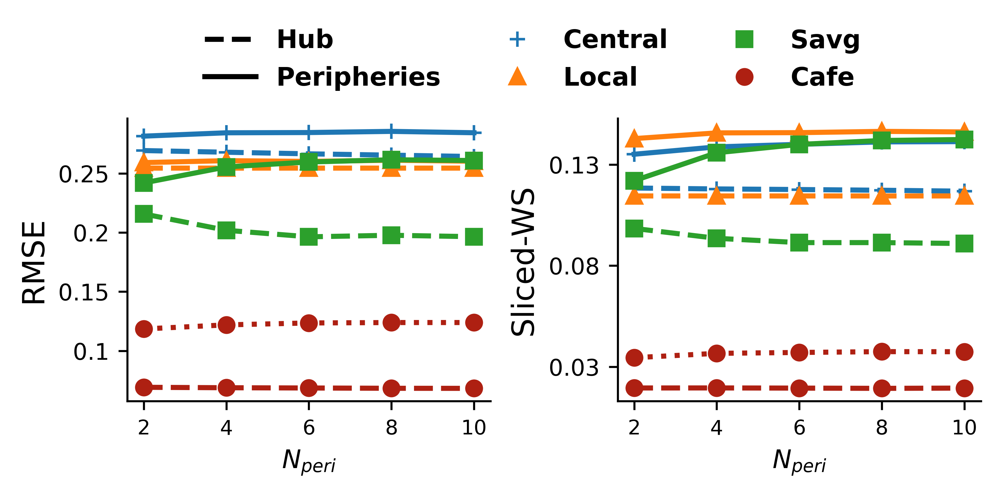

In [289]:
# scenario 1 - N = 1,3,5,7,9,11 vs Prediction AUROC | vs Imputation RMSE
plt.rcParams.update({'figure.dpi': '600'})
root = "M:\\OneDrive\\Projects\\federated_imputation_pc2\\results\\processed_results\\fed_imp_pc2\\s1_new\\codon.xlsx"
data = pd.read_excel(root, sheet_name="exp1-rl", header=0)
data = data[[
    'n_clients', 'method', 'rmse', 'sliced-ws', 'cent_rmse', 'cent_sliced-ws', 
    'peri_rmse', 'peri_sliced-ws', 'accu', 'f1'
]]

n_clients = [3, 5, 7, 9, 11] # 'central', 'local', 'simpleavg', 
method = ['central', 'local', 'simpleavg', 'fedmechw_new']
data = data[data['n_clients'].isin(n_clients)]
data = data[data['method'].isin(method)]
draw_linechart(
    data, x_values = [item -1 for item in n_clients], x_label = r'$N_{peri}$', metrics = ['rmse', 'sliced-ws'], 
    metrics2 = ['cent_rmse', 'peri_rmse', 'cent_sliced-ws', 'peri_sliced-ws'], c_p_label = ['Hub', 'Peripheries'], 
    output_name = 'line_s1')

0 0
0 1


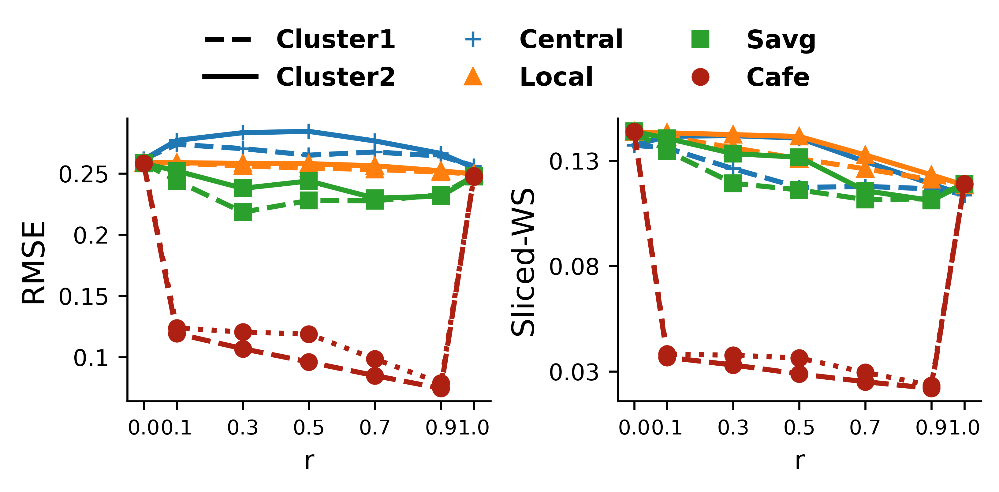

In [290]:
# scenario 2 - r = 0,0.1,0.3,0.5,0.7,0.9,1.0 vs Prediction AUROC | vs Imputation RMSE
plt.rcParams.update({'figure.dpi': '600'})
root = "M:\\OneDrive\\Projects\\federated_imputation_pc2\\results\\processed_results\\fed_imp_pc2\\0802\\codon\\results2.xlsx"
data = pd.read_excel(root, sheet_name="exp2", header=0)
data = data[[
    'n_clients', 'mechanism', 'method', 'rmse', 'sliced-ws', 'c1_rmse', 'c1_sliced-ws', 
    'c2_rmse', 'c2_sliced-ws'
]]
mechanism = [0.0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0]
method = ['central', 'local', 'simpleavg', 'fedmechw_new']
data
data = data[data['mechanism'].isin(mechanism)]
data = data[data['method'].isin(method)]
draw_linechart(data, x_values = mechanism, x_label = 'r',  metrics = ['rmse', 'sliced-ws'], 
    metrics2 = ['c1_rmse', 'c2_rmse', 'c1_sliced-ws', 'c2_sliced-ws'], c_p_label = ['Cluster1', 'Cluster2'],
    output_name = 'line_s2')

# Convergency Plots

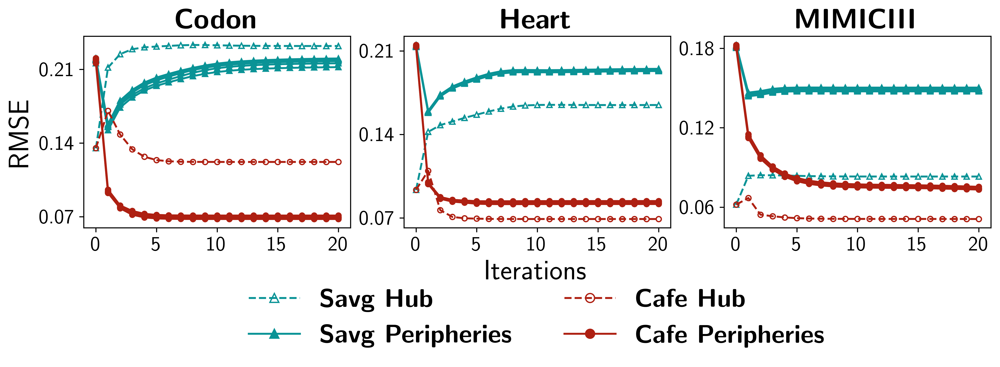

In [303]:
import matplotlib.lines as mlines
root = "M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\raw_results\\fed_imp_pc2\\1114"
n = 9
settings = {
    r"\textbf{Codon}": root + f"\\codon\\{n}\\sample-unevenr1-600\\mnar_lr@sp=extremer1\\fixed@mr=0.5\\",
    r"\textbf{Heart}": root + f"\\heart\\{n}\\sample-unevenl1-1000\\mnar_lr@sp=extremel1\\fixed@mr=0.5\\",
    r"\textbf{MIMICIII}": root + f"\\mimiciii_mo2\\{n}\\sample-unevenl1-1000\\mnar_lr@sp=extremel1\\fixed@mr=0.5\\",
}
methods = ['fedavg-s', 'fedmechw_new']

datas_dict = {}
for key in settings:
    datas_dict[key] = {}
    data_dir = settings[key]
    for method in methods:
        # read corresponding json file
        all_files = os.listdir(data_dir)
        ret_file = None
        for file in all_files:
            if method in file:
                ret_file = file
                break
        if ret_file is None:    
            raise ValueError("Method not found")
        
        # read json file
        with open(data_dir + ret_file + '.json') as f:
            result = json.load(f)
        
        # process result
        imp_ret = result["results"]["clients_imp_ret_clean"]["imp@rmse"]
        del imp_ret['client_avg']
        datas_dict[key][method] = np.array(list(imp_ret.values()))

#################### plot ##############################################################################
plt.rcParams['text.usetex'] = True
lw1 = '1'
ls1 = '--'
# plot params
style_dict = {
    "local": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "grey",
        "marker": "s",
        "label": r'\textbf{Local}'
    },
    "fedavg-s": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "#0A9396", #"#005F73",
        "marker": "^",
        "label": r'\textbf{Savg}'
    },
    "fedmechw_new": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "#AE2012",
        "marker": "o",
        "label": r"\textbf{Cafe}"
    },
}

label_size = 16
marker_size = 4
lw = '1.5'

plt.rcParams.update({'figure.dpi': '600'})
def conv_plots(datas_dict, mechs):
    
    fig, axes = plt.subplots(1, 3, figsize=(12.7, 2.7), sharey = False)
    for row_idx in range(3):
        data_dict = list(datas_dict.values())[row_idx]
        mech = mechs[row_idx]
        for method in data_dict.keys():
            # process data
            data = data_dict[method]
            c_idx = 0 if mech == 'l' else data.shape[0] - 1
            x = np.arange(data.shape[1])
            for cl_idx in range(data.shape[0]):
                ls = '--' if cl_idx == c_idx else '-'
                fillstyle = 'none' if cl_idx == c_idx else 'full'
                
                axes[row_idx].plot(
                    x, data[cl_idx], 
                    c = style_dict[method]['color'], 
                    marker = style_dict[method]['marker'], 
                    markersize = marker_size, 
                    linewidth = lw,
                    linestyle = ls,
                    fillstyle = fillstyle
                    # linestyle = style_dict[method]['line_style'], 
                    # linewidth = style_dict[method]['line_width']
                )
                
        axes[row_idx].set_title(list(datas_dict.keys())[row_idx], fontname="Computer Modern Serif", fontsize = 22)
        axes[0].set_yticks([0.07, 0.14, 0.21])
        axes[0].set_yticklabels([0.07, 0.14, 0.21], fontsize = 16)
        axes[1].set_yticks([0.07, 0.14, 0.21])
        axes[1].set_yticklabels([0.07, 0.14, 0.21], fontsize = 16)
        axes[2].set_yticks([0.06, 0.12, 0.18])
        axes[2].set_yticklabels([0.06, 0.12, 0.18], fontsize = 16)
        axes[1].set_xlabel(r"Iterations", fontname="Computer Modern Serif", fontsize = 22)
        axes[0].set_ylabel(r"RMSE", fontname="Computer Modern Serif", fontsize = 22)
        axes[row_idx].grid(False)
        for row_idx in range(3):
            axes[row_idx].set_xticks([0, 5, 10, 15, 20])
            axes[row_idx].set_xticklabels([0, 5, 10, 15, 20], fontsize = 16)
        
    # Create custom legends
    triangle_green_dotted = mlines.Line2D(
        [], [], color="#0A9396", marker='^', linestyle='--', fillstyle='none', label=r'\textbf{Savg Hub}', 
        markersize=marker_size+3)
    circle_red_dotted = mlines.Line2D(
        [], [], color="#AE2012", marker='o', linestyle='--', fillstyle='none', label=r'\textbf{Cafe Hub}',
        markersize=marker_size+3)
    triangle_green_solid = mlines.Line2D(
        [], [], color="#0A9396", marker='^', linestyle='-', label=r'\textbf{Savg Peripheries}',
        markersize=marker_size+3)
    circle_red_solid = mlines.Line2D(
        [], [], color="#AE2012", marker='o', linestyle='-', label=r'\textbf{Cafe Peripheries}',
        markersize=marker_size+3)
        
    plt.legend(
        handles=[triangle_green_dotted, triangle_green_solid, circle_red_dotted, circle_red_solid], 
        loc='upper center', bbox_to_anchor=(-0.7, -0.2), ncol=2, frameon = False, prop = { "size": 20, 'weight': 'bold'})
    plt.subplots_adjust(wspace=0.20, hspace=0.0)
    plt.savefig(f'figures/conv_s1.png', dpi=600, bbox_inches="tight")
    plt.show()

conv_plots(datas_dict, mechs = ['r', 'l', 'l'])


\textbf{Codon}
\textbf{Heart}
\textbf{MIMICIII}


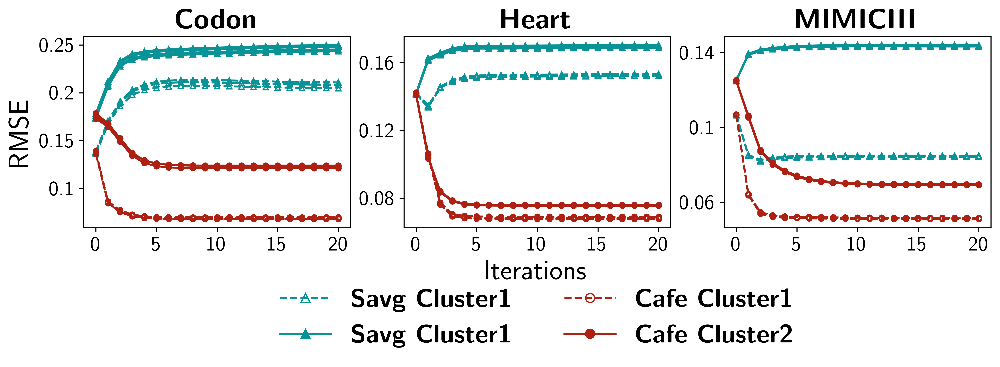

In [302]:
import matplotlib.lines as mlines
root = "M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\raw_results\\fed_imp_pc2\\"
r = 0.5
settings = {
    r"\textbf{Codon}": root + f"0802\\codon\\10\\sample-evenly\\mnar_lr@sp=extreme_r={0.5}\\fixed@mr=0.5\\",
    r"\textbf{Heart}": root + f"s2\\heart\\10\\sample-evenly\\mnar_lr@sp=extreme_r={0.5}\\fixed@mr=0.5\\",
    r"\textbf{MIMICIII}": root + f"s2\\mimiciii_mo2\\10\\sample-evenly\\mnar_lr@sp=extreme_r={0.5}\\fixed@mr=0.5\\",
}
methods = ['fedavg-s', 'fedmechw_new']

datas_dict = {}
for key in settings:
    print(key)
    datas_dict[key] = {}
    data_dir = settings[key]
    for method in methods:
        # read corresponding json file
        all_files = os.listdir(data_dir)
        ret_file = None
        for file in all_files:
            if method in file:
                ret_file = file
                break
        if ret_file is None:    
            raise ValueError("Method not found")
        
        # read json file
        with open(data_dir + ret_file + '.json') as f:
            result = json.load(f)
        
        # process result
        imp_ret = result["results"]["clients_imp_ret_clean"]["imp@rmse"]
        del imp_ret['client_avg']
        datas_dict[key][method] = np.array(list(imp_ret.values()))

#################### plot ##############################################################################
plt.rcParams['text.usetex'] = True
lw1 = '1'
ls1 = '--'
# plot params
style_dict = {
    "local": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "grey",
        "marker": "s",
        "label": r'\textbf{Local}'
    },
    "fedavg-s": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "#0A9396", #"#005F73",
        "marker": "^",
        "label": r'\textbf{Savg}'
    },
    "fedmechw_new": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "#AE2012",
        "marker": "o",
        "label": r"\textbf{Cafe}"
    },
}

label_size = 16
marker_size = 4
lw = '1.5'

plt.rcParams.update({'figure.dpi': '600'})
def conv_plots(datas_dict, rs):
    
    fig, axes = plt.subplots(1, 3, figsize=(12.7, 2.7), sharey = False)
    for row_idx in range(3):
        data_dict = list(datas_dict.values())[row_idx]
        for method in data_dict.keys():
            # process data
            data = data_dict[method]
            r = rs[row_idx]
            x = np.arange(data.shape[1])
            for cl_idx in range(data.shape[0]):
                ls = '--' if cl_idx < int(r*data.shape[0])  else '-'
                fillstyle = 'none' if cl_idx < int(r*data.shape[0])  else 'full'
                alpha = 1 if cl_idx < int(r*data.shape[0]) else 1
                
                axes[row_idx].plot(
                    x, data[cl_idx], 
                    c = style_dict[method]['color'], 
                    marker = style_dict[method]['marker'], 
                    markersize = marker_size, 
                    linewidth = lw,
                    linestyle = ls,
                    fillstyle = fillstyle,
                    alpha = alpha
                    # linestyle = style_dict[method]['line_style'], 
                    # linewidth = style_dict[method]['line_width']
                )
                
        axes[row_idx].set_title(list(datas_dict.keys())[row_idx], fontname="Computer Modern Serif", fontsize = 22)
        axes[0].set_yticks([0.10, 0.15, 0.20, 0.25])
        axes[0].set_yticklabels([0.10, 0.15, 0.20, 0.25], fontsize = 16)
        axes[1].set_yticks([0.08, 0.12, 0.16])
        axes[1].set_yticklabels([0.08, 0.12, 0.16], fontsize = 16)
        axes[2].set_yticks([0.06, 0.10, 0.14])
        axes[2].set_yticklabels([0.06, 0.10, 0.14], fontsize = 16)
        # axes[0].set_yticks([0.07, 0.14, 0.21])
        # axes[1].set_yticks([0.07, 0.14, 0.21])
        # axes[2].set_yticks([0.06, 0.12, 0.18])
        axes[1].set_xlabel(r"Iterations", fontname="Computer Modern Serif", fontsize = 22)
        axes[0].set_ylabel(r"RMSE", fontname="Computer Modern Serif", fontsize = 22)
        axes[row_idx].grid(False)
        for row_idx in range(3):
            axes[row_idx].set_xticks([0, 5, 10, 15, 20])
            axes[row_idx].set_xticklabels([0, 5, 10, 15, 20], fontsize = 16)
        
    # Create custom legends
    triangle_green_dotted = mlines.Line2D(
        [], [], color="#0A9396", marker='^', linestyle='--', fillstyle='none', label=r'\textbf{Savg Cluster1}',
        markersize=marker_size+3)
    circle_red_dotted = mlines.Line2D(
        [], [], color="#AE2012", marker='o', linestyle='--', fillstyle='none', label=r'\textbf{Cafe Cluster1}',
        markersize=marker_size+3)
    triangle_green_solid = mlines.Line2D(
        [], [], color="#0A9396", marker='^', linestyle='-', label=r'\textbf{Savg Cluster1}',
        markersize=marker_size+3)
    circle_red_solid = mlines.Line2D(
        [], [], color="#AE2012", marker='o', linestyle='-', label=r'\textbf{Cafe Cluster2}',
        markersize=marker_size+3)
        
    plt.legend(
        handles=[triangle_green_dotted, triangle_green_solid, circle_red_dotted, circle_red_solid], 
        loc='upper center', bbox_to_anchor=(-0.7, -0.2), ncol=2, frameon = False, prop = { "size": 20, 'weight': 'bold'})
    plt.subplots_adjust(wspace=0.20, hspace=0.0)
    plt.savefig(f'figures/conv_s2.png', dpi=600, bbox_inches="tight")
    plt.show()

conv_plots(datas_dict, rs = [0.5, 0.5, 0.5])


# TSNE Plot

In [8]:
from sklearn.manifold import TSNE
import gower

plt.rcParams.update({'figure.dpi': '100'})
root = "M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\raw_results\\fed_imp_pc2\\1114\\codon\\11\\sample-unevenl1-600\\mnar_lr@sp=extremel1\\fixed@mr=0.5"
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
data_dict = {}

for method in methods:
    origin_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\origin_data_0.npy')
    imputed_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\imputed_data_0.npy')
    split_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\split_indices_0.npy')
    data_dict[method] = (origin_data, imputed_data, split_data)

# tsne plot for one client
client_indices = [0, 10]
client_labels = ['Hub', 'Periphery']
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
method_name = ['Central', 'Local', 'SAvg', 'Cafe']

######################################################################################
# tsne computing
tsne_results_dict = {}
colors_result = {}
for method in methods:
    
    origin_data = data_dict[method][0]
    imputed_data = data_dict[method][1]
    split_indices = data_dict[method][2]
    if split_indices.size == 0:
        split_indices = data_dict['local'][2]
    origin_datas = np.split(origin_data, split_indices, axis=0)
    imputed_datas = np.split(imputed_data, split_indices, axis=0)
    
    # overall
    plot_data = np.concatenate((origin_data, imputed_data), axis = 0)
    N1 = origin_data.shape[0]
    N2 = imputed_data.shape[0]
    colors = ["red" for i in range(N1)] +  ["blue" for i in range(N2)]
    tsne = TSNE(metric='precomputed', n_components = 2, verbose = 0, n_iter= 1000, perplexity = 40, n_iter_without_progress = 300, init = 'random')
    tsne_results = tsne.fit_transform(np.clip(gower.gower_matrix(plot_data), 0, 1))
    print('Ploting TSNE for client {} with method {} ...'.format('overall', method))
    tsne_results_dict[('overall', method)] = tsne_results
    colors_result[('overall', method)] = colors    

    # client specific
    for client_index, client_label in zip(client_indices, client_labels):
        # data for one client
        origin_data = origin_datas[client_index]
        imputed_data = imputed_datas[client_index]
        plot_data = np.concatenate((origin_data, imputed_data), axis = 0)
        
        # Parameters
        N1 = origin_data.shape[0]
        N2 = imputed_data.shape[0]
        colors = ["red" for i in range(N1)] +  ["blue" for i in range(N2)]    

        # TSNE anlaysis
        tsne = TSNE(metric='precomputed', n_components = 2, verbose = 0, n_iter= 1000, perplexity = 40, n_iter_without_progress = 300, init = 'random')
        tsne_results = tsne.fit_transform(np.clip(gower.gower_matrix(plot_data), 0, 1))
        print('Ploting TSNE for client {} with method {} ...'.format(client_label, method))
        tsne_results_dict[(client_label, method)] = tsne_results
        colors_result[(client_label, method)] = colors
    

Ploting TSNE for client overall with method central ...
Ploting TSNE for client Hub with method central ...
Ploting TSNE for client Periphery with method central ...
Ploting TSNE for client overall with method local ...
Ploting TSNE for client Hub with method local ...
Ploting TSNE for client Periphery with method local ...
Ploting TSNE for client overall with method fedavg-s ...
Ploting TSNE for client Hub with method fedavg-s ...
Ploting TSNE for client Periphery with method fedavg-s ...
Ploting TSNE for client overall with method fedmechw_new ...
Ploting TSNE for client Hub with method fedmechw_new ...
Ploting TSNE for client Periphery with method fedmechw_new ...


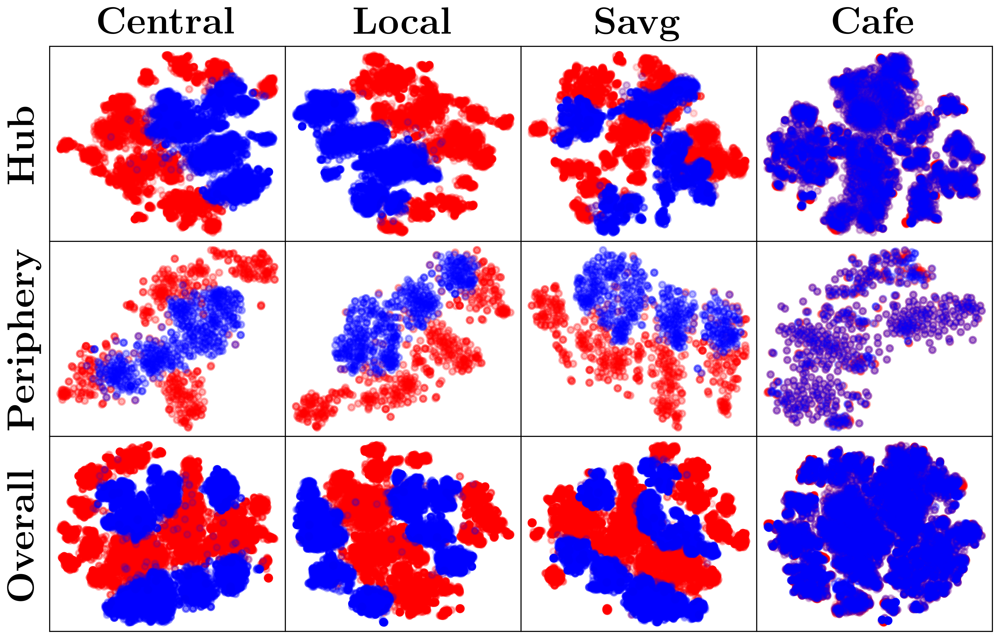

In [9]:
def to_bold_raw(string):
    string = r'\textbf{' + fr"{string}" + r'}'
    return string


def tsne_plot(tsne_results_dict, colors_result, output_name, methods, client_indices, method_name, alphas):
    with plt.style.context(['science', 'ieee', 'scatter']):

        fig, axes = plt.subplots(3, 4, figsize=(8, 5))

        for col_idx, method in enumerate(methods):
            
            for row_idx, client_index in enumerate(client_indices):
                
                tsne_results = tsne_results_dict[(client_index, method)]
                colors = colors_result[(client_index, method)]

                # Plotting
                axes[row_idx, col_idx].scatter(
                    tsne_results[:N1,0], tsne_results[:N1,1], c = colors[:N1], alpha = alphas[row_idx], label = "Original")
                axes[row_idx, col_idx].scatter(
                    tsne_results[N1:,0], tsne_results[N1:,1], c = colors[N1:], alpha = alphas[row_idx], label = "Imputed")
                #axes[row_idx, col_idx].set_title(f'{method_name[col_idx]}')
                axes[row_idx, col_idx].set_xticklabels([])
                axes[row_idx, col_idx].set_yticklabels([])
                axes[row_idx, col_idx].set_xticks([])
                axes[row_idx, col_idx].set_yticks([])
        
        for i in range(4):
            axes[0, i].set_title(to_bold_raw(method_name[i]), fontsize = 18, fontweight = 'black')
        
        for j in range(3):
            axes[j, 0].set_ylabel(to_bold_raw(f'{client_indices[j].title()}'), fontsize = 18, fontweight = 'black')
        
        plt.subplots_adjust(hspace=0)
        plt.subplots_adjust(wspace=0)
        fig.savefig(f'figures/{output_name}.png', dpi=600)
        plt.show()
        
output_name = 'tsne_plot_s1_11'
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
client_labels = ['Hub', 'Periphery', 'overall']
method_name = ['Central', 'Local', 'Savg', 'Cafe']
tsne_plot(tsne_results_dict, colors_result, output_name, methods, client_labels, method_name, alphas = [0.15, 0.3, 0.15])

In [10]:
from sklearn.manifold import TSNE
import gower

plt.rcParams.update({'figure.dpi': '100'})
ratio = 0.5
root = f"M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\raw_results\\fed_imp_pc2\\0802\\codon\\10\\sample-evenly\\mnar_lr@sp=extreme_r={ratio}\\fixed@mr=0.5"
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
data_dict = {}

for method in methods:
    origin_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\origin_data_0.npy')
    imputed_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\imputed_data_0.npy')
    split_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\split_indices_0.npy')
    data_dict[method] = (origin_data, imputed_data, split_data)

# tsne plot for one client
client_indices = [0, 9]
client_labels = ['Cluster1', 'Cluster2']
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
method_name = ['Central', 'Local', 'Savg', 'Cafe']

######################################################################################
# tsne computing
tsne_results_dict2 = {}
colors_result2 = {}
for method in methods:
    
    origin_data = data_dict[method][0]
    imputed_data = data_dict[method][1]
    split_indices = data_dict[method][2]
    if split_indices.size == 0:
        split_indices = data_dict['local'][2]
    origin_datas = np.split(origin_data, split_indices, axis=0)
    imputed_datas = np.split(imputed_data, split_indices, axis=0)
    
    # overall
    plot_data = np.concatenate((origin_data, imputed_data), axis = 0)
    N1 = origin_data.shape[0]
    N2 = imputed_data.shape[0]
    colors = ["red" for i in range(N1)] +  ["blue" for i in range(N2)]
    tsne = TSNE(metric='precomputed', n_components = 2, verbose = 0, n_iter= 1000, perplexity = 40, n_iter_without_progress = 300, init = 'random')
    tsne_results = tsne.fit_transform(np.clip(gower.gower_matrix(plot_data), 0, 1))
    print('Ploting TSNE for client {} with method {} ...'.format('overall', method))
    tsne_results_dict2[('overall', method)] = tsne_results
    colors_result2[('overall', method)] = colors    

    for client_index, client_label in zip(client_indices, client_labels):
        # data for one client
        origin_data = origin_datas[client_index]
        imputed_data = imputed_datas[client_index]
        plot_data = np.concatenate((origin_data, imputed_data), axis = 0)
        
        # Parameters
        N1 = origin_data.shape[0]
        N2 = imputed_data.shape[0]
        colors = ["red" for i in range(N1)] +  ["blue" for i in range(N2)]    

        # TSNE anlaysis
        tsne = TSNE(metric='precomputed', n_components = 2, verbose = 0, n_iter= 1000, perplexity = 40, n_iter_without_progress = 300, init = 'random')
        tsne_results = tsne.fit_transform(np.clip(gower.gower_matrix(plot_data), 0, 1))
        print('Ploting TSNE for client {} with method {} ...'.format(client_label, method))
        tsne_results_dict2[(client_label, method)] = tsne_results
        colors_result2[(client_label, method)] = colors

Ploting TSNE for client overall with method central ...
Ploting TSNE for client Cluster1 with method central ...
Ploting TSNE for client Cluster2 with method central ...
Ploting TSNE for client overall with method local ...
Ploting TSNE for client Cluster1 with method local ...
Ploting TSNE for client Cluster2 with method local ...
Ploting TSNE for client overall with method fedavg-s ...
Ploting TSNE for client Cluster1 with method fedavg-s ...
Ploting TSNE for client Cluster2 with method fedavg-s ...
Ploting TSNE for client overall with method fedmechw_new ...
Ploting TSNE for client Cluster1 with method fedmechw_new ...
Ploting TSNE for client Cluster2 with method fedmechw_new ...


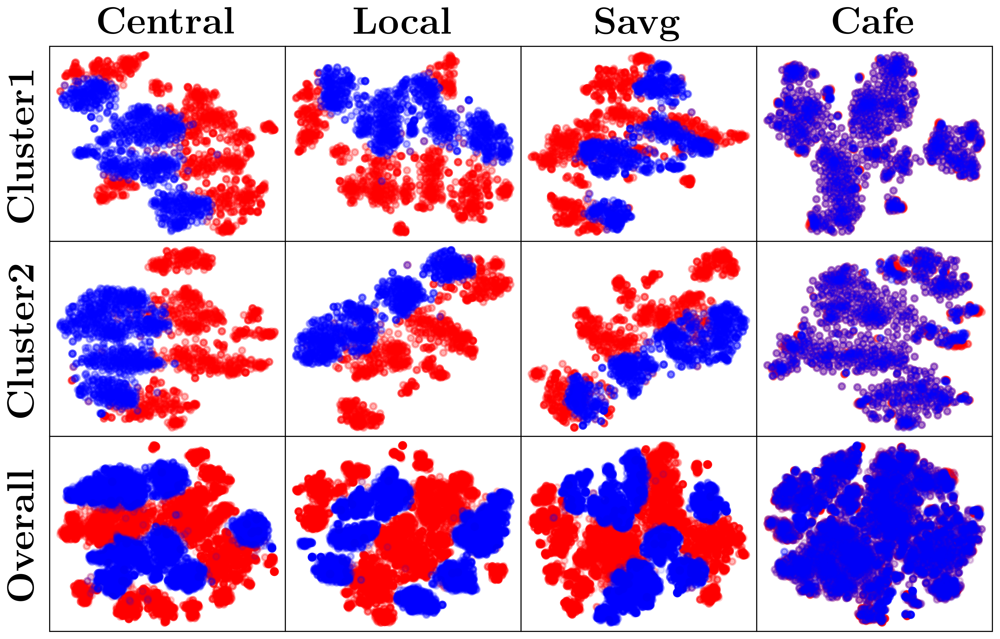

In [19]:
output_name = 'tsne_plot_s2_0.5'
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
client_indices = ['Cluster1', 'Cluster2', 'overall']
method_name = ['Central', 'Local', 'Savg', 'Cafe']
tsne_plot(tsne_results_dict2, colors_result2, output_name, methods, client_indices, method_name, alphas = [0.3, 0.3, 0.1])

# Heatmap

In [32]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances

def vis_local_model_sim(tracker, iteration, model = 'local', metric = 'cos'):
    n_cols = 5
    n_rows = 4
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 2.5))

    for feature_idx in range(n_rows * n_cols):
        clients_records = [item for item in tracker.records if item.iteration == iteration and item.feature_idx == feature_idx]
        if model == 'local':
            X = clients_records[0].local_imp_model_params
        elif model == 'mm':
            X = clients_records[0].local_mm_model_params
        # tsne = TSNE(n_components=2, verbose=0, perplexity=4, n_iter=500)
        # decomp_results = tsne.fit_transform(X)
        ax = axes[feature_idx // n_cols, feature_idx % n_cols]
        if metric == 'cos':
            cosine_sim = 1 - (cosine_similarity(X) + 1)/2
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = ax, vmin = 0, vmax =1)
        elif metric == 'l2':
            cosine_sim = euclidean_distances(X)
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = ax)
        else:
            raise NotImplementedError
        ax.title.set_text("feature {}".format(feature_idx))
    
    fig.suptitle("{}".format(model))
    plt.tight_layout()
    plt.show()

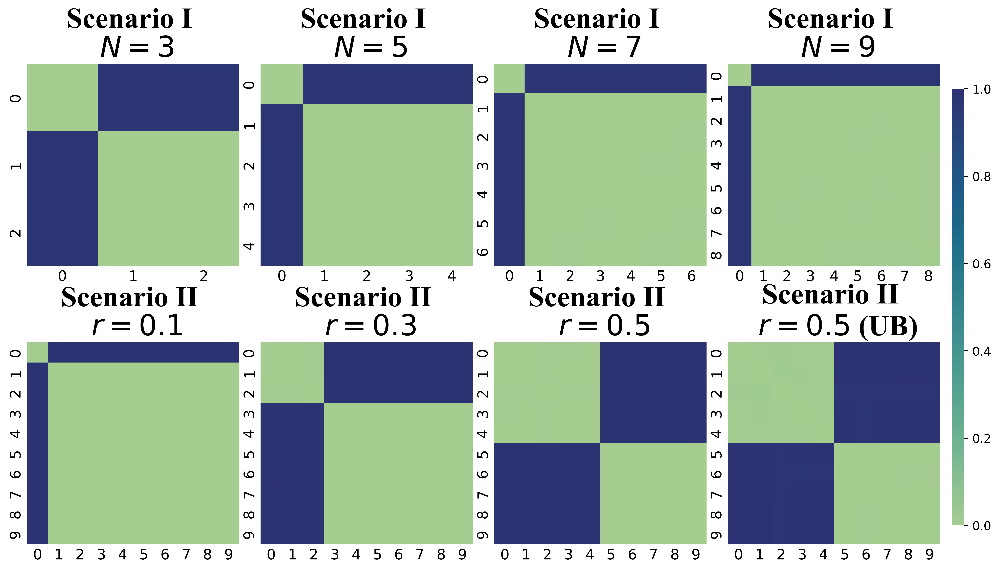

In [128]:
# settings
root = "M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\raw_results\\fed_imp_pc2"
plt.rcParams['text.usetex'] = False
settings = [
    root + "\\1114\\codon\\3\\sample-unevenl1-600\\mnar_lr@sp=extremel1\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
    root + "\\1114\\codon\\5\\sample-unevenl1-600\\mnar_lr@sp=extremel1\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
    root + "\\1114\\codon\\7\\sample-unevenl1-600\\mnar_lr@sp=extremel1\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
    root + "\\1114\\codon\\9\\sample-unevenl1-600\\mnar_lr@sp=extremel1\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
    root + "\\0802\\codon\\10\\sample-evenly\\mnar_lr@sp=extreme_r=0.1\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
    root + "\\0802\\codon\\10\\sample-evenly\\mnar_lr@sp=extreme_r=0.3\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
    root + "\\0802\\codon\\10\\sample-evenly\\mnar_lr@sp=extreme_r=0.5\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
    root + "\\1104\\codon\\10\\sample-uneven10\\mnar_lr@sp=extreme_r=0.5\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
]


settings_name = [
    "Scenario I \n $N = 3$",
    "Scenario I \n $N = 5$",
    "Scenario I \n $N = 7$",
    "Scenario I \n $N = 9$",
    "Scenario II \n $r = 0.1$",
    "Scenario II \n $r = 0.3$",
    "Scenario II \n $r = 0.5$",
    "Scenario II \n $r = 0.5$ (UB)"
]


features = [1]
fig, axes = plt.subplots(2, 4, figsize=(4 * 3.4, 2.4 * 3), squeeze=False)

for setting_idx, setting in enumerate(settings):
    for feature_idx, feature in enumerate(features):
        col_idx = setting_idx % 4
        row_idx = setting_idx // 4
        mm_coefs = np.load(setting)
        cosine_sim = 1 - (cosine_similarity(mm_coefs[feature]) + 1)/2
        if col_idx !=3:
            sns.heatmap(cosine_sim, annot=False, cmap = sns.color_palette("crest", as_cmap=True), ax = axes[row_idx, col_idx], vmin = 0, vmax =1, cbar = False, cbar_ax = None)
        else:
            sns.heatmap(cosine_sim, annot=False, cmap= sns.color_palette("crest", as_cmap=True), ax = axes[row_idx, col_idx], vmin = 0, vmax =1, cbar = True, cbar_ax = fig.add_axes([.91, 0.14, .01, 0.7]))
        
        # if col_idx == 0:
        #     axes[row_idx, col_idx].set_ylabel("Feature1", fontsize = 18, fontweight = 'black', fontname="Times New Roman")
            
        #if row_idx == 0:
        axes[row_idx, col_idx].set_title(settings_name[setting_idx], fontsize = 24, fontweight = 'black', fontname="Times New Roman")
            
        axes[row_idx, col_idx].tick_params(axis=u'both', which=u'both',length=0, labelsize=12)
plt.subplots_adjust(wspace=0.1, hspace=0.38)
fig.savefig(f'figures/heatmap.png', dpi=600, bbox_inches="tight")
plt.show()

# New Plots Settings

In [83]:
style_dict = {
    "central": {
        "color": '#1f77b4',
        "marker": "+",
        'label': r'Central'
    }, 
    "local": {
        "color": '#ff7f0e',
        "marker": "^",
        "label": r'Local'
    },
    "simpleavg": {
        "color": '#2ca02c',
        "marker": "s",
        "label": r'Savg'
    },
    "fedmechw_new": {
        "color": "#AE2012", #'#d62728'
        "marker": "o",
        "label": r"Cafe"
    },
}

In [116]:
# read data
datasets = ['codon', 'codrna', 'mimiciii', 'heart', 'genetic']
dir = "M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\processed_results\\fed_imp_pc2\\new\\"
data = {}
scenarios = ['ideal_perfect', 'perfect_s3', 'imperfect_s32', 'one_side_comp_s33', 'no_comp']

for dataset in datasets:
    df = pd.read_excel(dir + f"{dataset}.xlsx", sheet_name = 'imp', header = 0)
    data[dataset] = {}
    for method in ['central', 'local', 'simpleavg', 'fedmechw_new']:
        ret = df[df['method'] == method].copy()
        ret['scenario'] = pd.Categorical(ret['scenario'], categories = scenarios, ordered = True)
        ret = ret.sort_values(by = 'scenario')
        data[dataset][method] = list(ret['rmse'].values)
         
print(data)

{'codon': {'central': [0.2742938278204093, 0.2481014044647375, 0.2458639654180649, 0.2539791442276261, 0.2615963786157734], 'local': [0.2541737251593985, 0.2617058356430362, 0.2672097238993644, 0.2676546287212635, 0.2589382131373414], 'simpleavg': [0.2278772751927848, 0.2201850456223771, 0.2275238838133332, 0.2550016926936193, 0.2583418899017879], 'fedmechw_new': [0.09603694278242174, 0.0791910776189371, 0.1825122574576934, 0.2583987370467895, 0.2582079519985641]}, 'codrna': {'central': [0.214884080659832, 0.2061800641925919, 0.1975845215968199, 0.2604501942000697, 0.3132072420707629], 'local': [0.3021654725731852, 0.3028638348952227, 0.3025062049665977, 0.2888848230145952, 0.3169867063429683], 'simpleavg': [0.1075853674642426, 0.2171139193175155, 0.2219127340723637, 0.2752864075419214, 0.3178390519743106], 'fedmechw_new': [0.08554579484311042, 0.08229110395382339, 0.1363576776571962, 0.2800860338335747, 0.3178799284034449]}, 'mimiciii': {'central': [0.17364567591824, 0.163310071992127

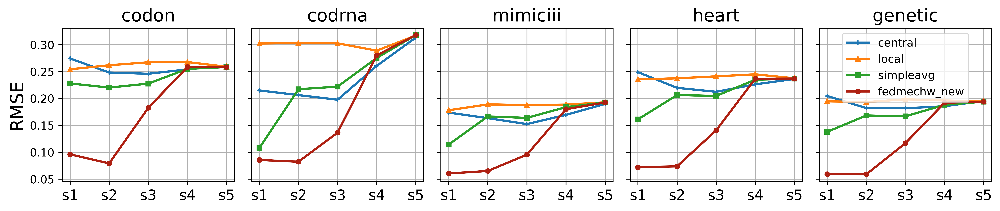

In [133]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

plt.rcParams['text.usetex'] = False
plt.rcParams.update({'figure.dpi': '600'})

ls = '-'
lw = '2'
marker_size = 4
#with plt.style.context(['science', 'ieee', 'scatter']):
fig, axes = plt.subplots(1, 5, figsize=(15, 2.5), squeeze = False, sharey = True)

for col_idx, dataset in enumerate(data.keys()):
    for method in ['central', 'local', 'simpleavg', 'fedmechw_new']:
        axes[0, col_idx].plot(
            [0, 1, 2, 3, 4], data[dataset][method], 
            color = style_dict[method]['color'], 
            linestyle = ls, 
            label = method, 
            linewidth = lw,
            marker = style_dict[method]['marker'],
            markersize = marker_size
        )
        
        axes[0, col_idx].set_xticks([0, 1, 2, 3, 4])
        axes[0, col_idx].set_xticklabels(['s1', 's2', 's3', 's4', 's5'], fontsize = 13)
    
    axes[0, col_idx].set_title(dataset, fontsize = 16)
    if col_idx == 0:
        axes[0, col_idx].set_ylabel('RMSE', fontsize = 16)
    axes[0, col_idx].grid(True)

formatter = ticker.FormatStrFormatter('%.2f')
for ax in axes.flat:
    ax.yaxis.set_major_formatter(formatter)
#plt.gca().yaxis.set_major_formatter(formatter)
plt.subplots_adjust(wspace=0.1, hspace=0.0)
plt.legend()
plt.show()

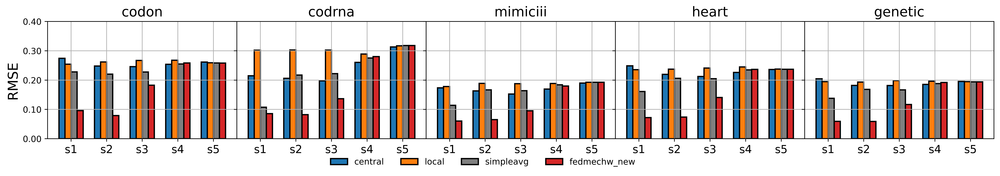

In [123]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

plt.rcParams['text.usetex'] = False
plt.rcParams.update({'figure.dpi': '600'})

ls = '-'
lw = '2'
marker_size = 4

fig, axes = plt.subplots(1, 5, figsize=(20, 2.5), squeeze = False, sharey=True)
bin_width = 0.8
interval_width = 1.5
lw = 1.5

for col_idx, dataset in enumerate(data.keys()):
    
    bar_data = np.array(list(data[dataset].values()))
    for s in range(bar_data.shape[1]):
        height = bar_data[:, s]
        positions = [s*interval_width + s*4*bin_width + i*bin_width for i in range(4)]
        bp = axes[0, col_idx].bar(
            x = positions, height = height, width = bin_width, linewidth=[lw]*4, yerr = 0.00,
            ecolor='black', edgecolor = 'black',
            color = ['#1f77b4', '#ff7f0e', '#7f7f7f', '#d62728'], #hatch = ['\\', 'x', '-',  '/']
        )
        
    n_cols = 5
    methods = ['central', 'local', 'simpleavg', 'fedmechw_new']
    x0 = 0 - bin_width/2 - interval_width
    x1 = (n_cols-1)*interval_width + (n_cols-1)*4*bin_width + (len(methods)-1)*bin_width + bin_width/2 + interval_width
    axes[0, col_idx].set_xlim([x0, x1])
    axes[0, col_idx].set_xticks([i*interval_width + i*4*bin_width + 1.5*bin_width for i in range(5)])
    axes[0, col_idx].set_xticklabels(['s1', 's2', 's3', 's4', 's5'], fontsize = 13)
    axes[0, col_idx].set_ylim([0, 0.4])
    
    axes[0, col_idx].set_title(dataset, fontsize = 16)
    if col_idx == 0:
        axes[0, col_idx].set_ylabel('RMSE', fontsize = 16)
    axes[0, col_idx].grid(True)

formatter = ticker.FormatStrFormatter('%.2f')
for ax in axes.flat:
    ax.yaxis.set_major_formatter(formatter)
#plt.gca().yaxis.set_major_formatter(formatter)
legend = plt.legend(
        [bp[0], bp[1], bp[2], bp[3]], 
        [method for method in methods], 
        loc='upper center', bbox_to_anchor=(-1.7, -0.1), 
        ncol=4,
        frameon=False
    )
plt.subplots_adjust(wspace=0)
plt.show()